# UMAP, visualizing individual parameters and correlation matrix (APOC)

In [1]:
import napari
from napari.utils import nbscreenshot
import pandas as pd
from os import listdir
from os.path import isfile, join
import numpy as np
import os
from skimage.io import imread
import numpy as np
from skimage import measure
from napari_clusters_plotter._dimensionality_reduction import DimensionalityReductionWidget
from napari_clusters_plotter._dock_widget import PlotterWidget
from napari_skimage_regionprops import add_table

## Merging timepoints and opening nuclei-, membrane- and label-channel in napari

We use a timelapse dataset of the marine annelid Platynereis dumerilii from  [Ozpolat, B. et al](https://doi.org/10.5281/zenodo.1063531) licensed by [CC BY 4.0](https://creativecommons.org/licenses/by/4.0/legalcode) (rescaled to 256x256x103). We use the nuclei-channel, the membrane-channel and [StarDist](https://github.com/stardist/stardist)-labels. Currently, the individual timepoints are as tif-files in separate folders. So we merge these timepoints first by opening them as a stack in napari.

In [2]:
nuclei_loc = "C:/Users/maral/Documents/WHK Bio-image Analysis Group/1. Nuclei und Zellen segmentieren, tracken, klassifizieren/Image 6 single timepoints gaussian (256x256x103)/"
membrane_loc = "C:/Users/maral/Documents/WHK Bio-image Analysis Group/1. Nuclei und Zellen segmentieren, tracken, klassifizieren/Image 6 single timepoints gaussian channel 0(256x256x103)/"
#label_loc = "C:/Users/maral/Documents/WHK Bio-image Analysis Group/1. Nuclei und Zellen segmentieren, tracken, klassifizieren/Image 6 single timepoints voronoi otsu labeling (256x256x103)/"
label_loc = "C:/Users/maral/Documents/WHK Bio-image Analysis Group/1. Nuclei und Zellen segmentieren, tracken, klassifizieren/Image 6 single timepoints labels/"

In [3]:
#append directory and sort
def get_sorted_image_list(directory):
    files = [join(directory, f) for f in listdir(directory) if isfile(join(directory, f)) and f.endswith('tif')]
    return sorted(files)

In [4]:
all_nuclei_locs = get_sorted_image_list(nuclei_loc)
all_membrane_locs = get_sorted_image_list(membrane_loc)
all_label_locs = get_sorted_image_list(label_loc)

In [5]:
#open napari 
viewer = napari.Viewer()
nuclei_layer = viewer.open(all_nuclei_locs, stack=True, plugin="builtins", name = "nuclei")
membrane_layer = viewer.open(all_membrane_locs, stack=True, plugin="builtins", name = "membranes")

In [6]:
viewer.dims.ndisplay=3

In the viewer, we see that some of the objects which are in the nuclei-channel are also present in the membrane channel.

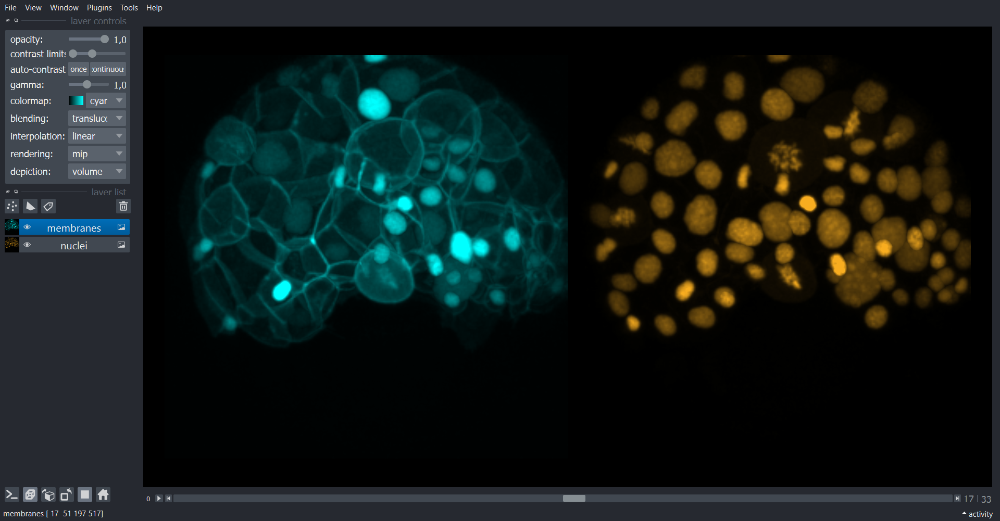

In [7]:
nbscreenshot(viewer)

# Feature extraction

## ... from membrane channel

In [7]:
membrane_list = []
for labels, membrane, i in zip(all_label_locs, all_membrane_locs, range(len(all_membrane_locs))):
    labels = imread(labels)
    membrane = imread(membrane)
    table = pd.DataFrame(measure.regionprops_table(labels, membrane, properties=['label', 
                                                                                'area', 
                                                                                'axis_major_length', 
                                                                                'axis_minor_length', 
                                                                                'feret_diameter_max', 
                                                                                'solidity', 
                                                                                'intensity_mean',
                                                                                'intensity_max',
                                                                                'intensity_min'
    ]))
    table['frame'] = i
    membrane_list.append(table)

In [8]:
membrane_table = pd.concat(membrane_list)
membrane_table

,label,area,axis_major_length,axis_minor_length,feret_diameter_max,solidity,intensity_mean,intensity_max,intensity_min,frame
0,1,39213,60.885716,33.439009,59.270566,0.946579,0.370741,0.707742,0.030328,0
1,2,24982,53.531667,27.341050,52.545219,0.944035,0.067627,0.118126,0.010130,0
2,3,21173,45.840576,27.484441,45.880279,0.932690,0.045129,0.084016,0.013233,0
3,4,17760,39.187404,27.741350,39.761791,0.931501,0.034841,0.059639,0.011443,0
4,5,18332,47.594375,24.910071,45.000000,0.942180,0.047609,0.075320,0.009169,0
...,...,...,...,...,...,...,...,...,...,...
192,193,1516,15.846743,12.905557,17.233688,0.912154,0.022349,0.037803,0.011589,33
193,194,663,18.755101,8.278928,20.420578,0.815498,0.206956,0.268527,0.106839,33
194,195,1638,21.803616,10.173342,21.794495,0.900495,0.056816,0.080725,0.041119,33
195,196,1737,24.254017,10.511627,24.372115,0.802680,0.088481,0.159896,0.053539,33


In [9]:
viewer.open(all_label_locs, stack=True, plugin="builtins", layer_type = "labels", features = membrane_table, name = "nuclei labels")
label_layer = viewer.layers["nuclei labels"]
add_table(label_layer, viewer)

Napari status bar display of label properties disabled because https://github.com/napari/napari/issues/5417 and https://github.com/napari/napari/issues/4342


Furthermore, we have a label image created using the nuclei-channel. If we now compute a UMAP, the assumption would be that we have two groups of datapoints:
- 1st group: objects which are present both in the nuclei and membrane channel
- 2nd group: objects which are only present in the nuclei channel

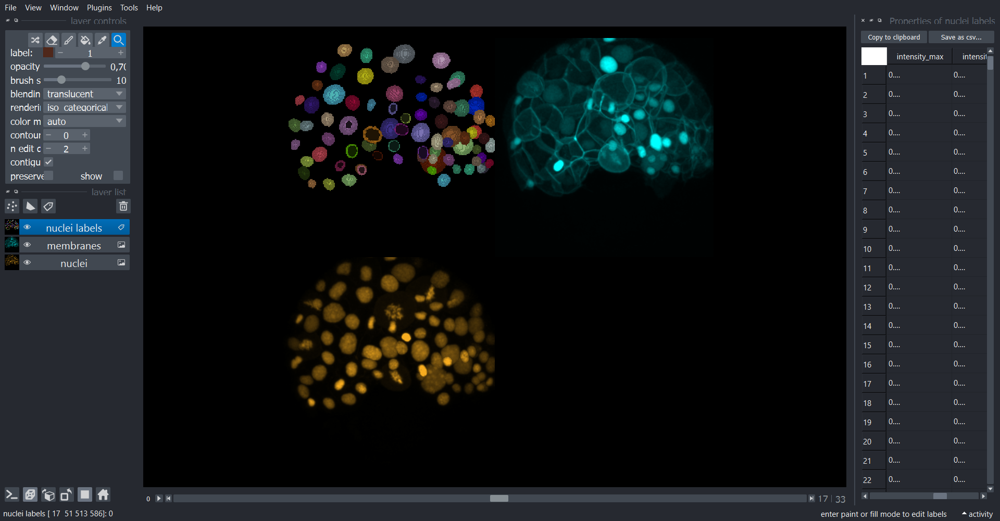

In [13]:
nbscreenshot(viewer)

# Dimensionality reduction

To compute the UMAP, we try to use a subset of all parameters: `area` as a size-based parameters, `feret_diameter_max` and `solidity` as shape-based parameters and the `intensity_mean` as intensity-based parameter.

In [10]:
dimensionality_reduction_widget = DimensionalityReductionWidget(viewer)
dimensionality_reduction_dock_widget = viewer.window.add_dock_widget(dimensionality_reduction_widget)

Selected labels layer: nuclei labels
Selected measurements: ['area', 'feret_diameter_max', 'solidity', 'intensity_mean']
UMAP(random_state=133, verbose=True)
Fri Apr 14 13:30:23 2023 Construct fuzzy simplicial set
Fri Apr 14 13:30:27 2023 Finding Nearest Neighbors
Fri Apr 14 13:30:29 2023 Finished Nearest Neighbor Search
Fri Apr 14 13:30:31 2023 Construct embedding


Dimensionality reduction progress:   0%|            0/500 [00:00]

Fri Apr 14 13:30:36 2023 Finished embedding
Napari status bar display of label properties disabled because https://github.com/napari/napari/issues/5417 and https://github.com/napari/napari/issues/4342
Dimensionality reduction finished


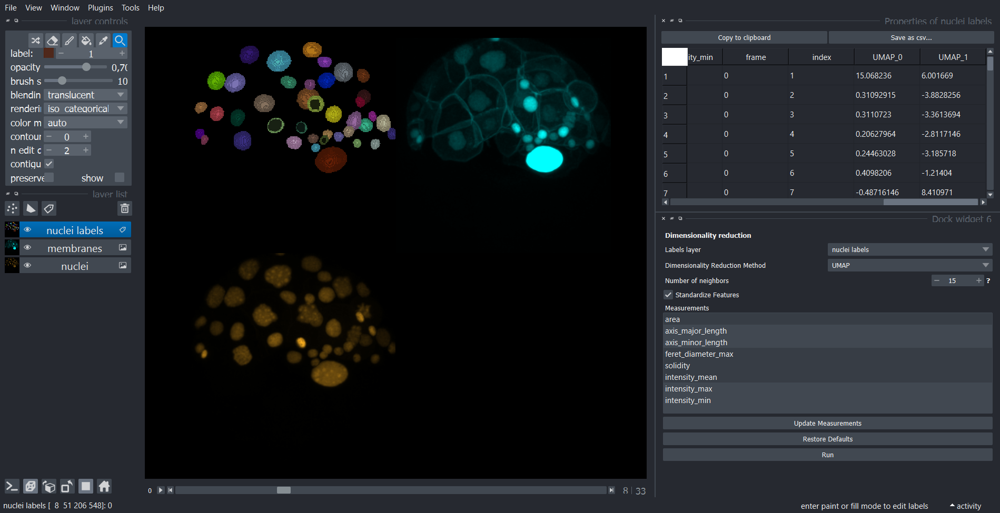

In [22]:
nbscreenshot(viewer)

In [11]:
dimensionality_reduction_widget.hide()

# Plotting

In [14]:
plotter_widget = PlotterWidget(viewer)
plotter_dock_widget = viewer.window.add_dock_widget(plotter_widget)

In [15]:
plotter_widget.plot_x_axis.setCurrentText("UMAP_0")
plotter_widget.plot_y_axis.setCurrentText("UMAP_1")

# workaround to click run button programmatically
layout = plotter_widget.layout()
widgetitem = layout.itemAt(layout.count()-2)
run_button = widgetitem.widget().layout().itemAt(0).widget()
run_button.clicked.emit()

We can see that one datapoint is not clustered together with the others:

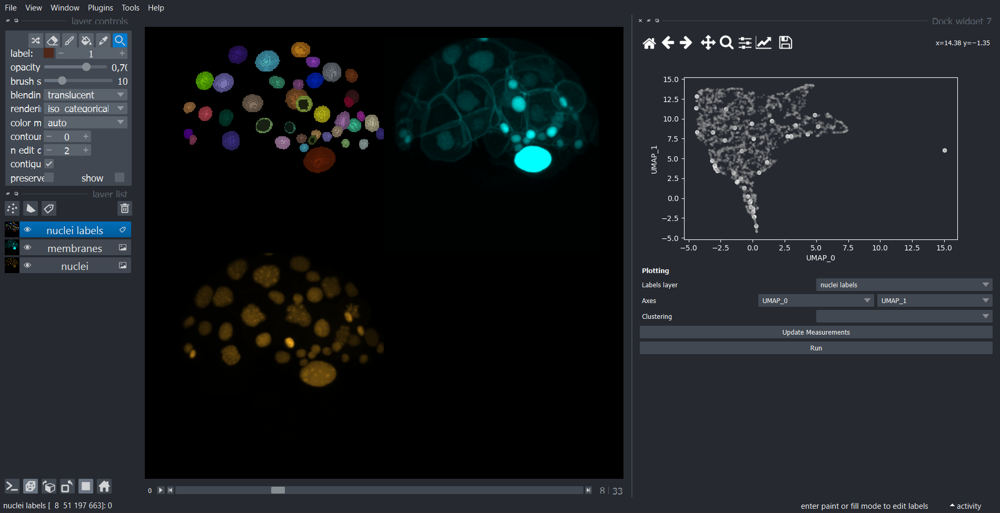

In [26]:
nbscreenshot(viewer)

We can select it using manual clustering with the lasso tool:

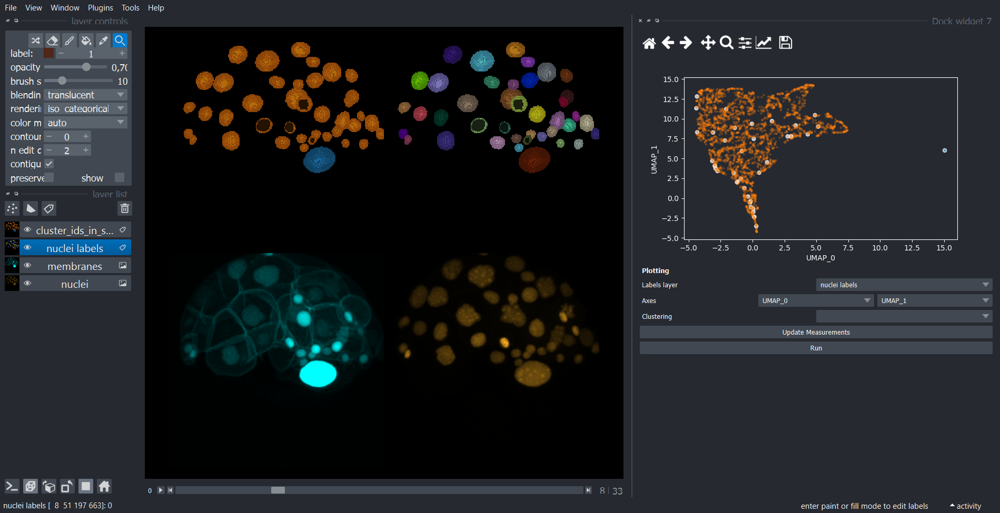

In [27]:
nbscreenshot(viewer)

By holding `SHIFT`, we can select more than one cluster ID:

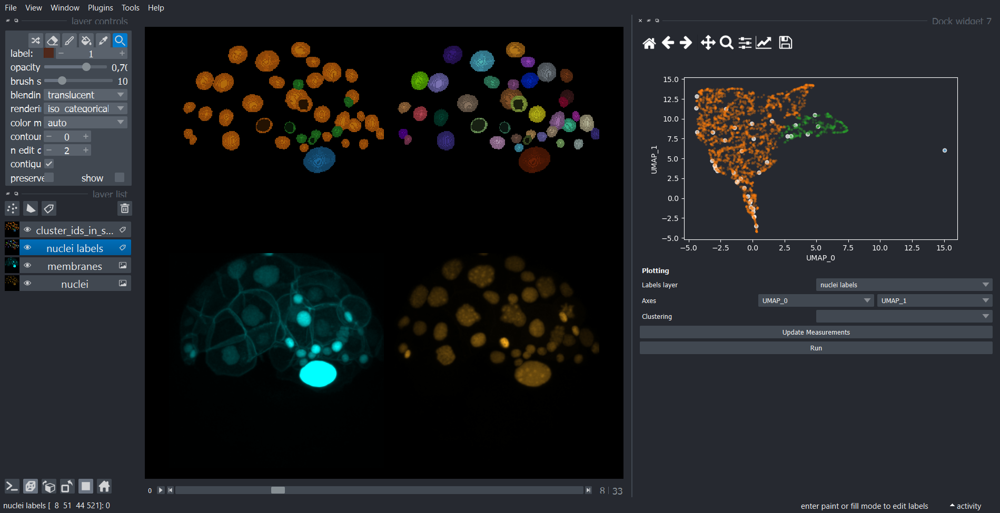

In [30]:
nbscreenshot(viewer)

The blue and green datapoints seem to be bright objects in the membrane channel. And the green objects seem to have a similar size. We can investigate these hypotheses by plotting different measurements against each other:

If we plot `area` against `solidity`, we are not able to distinguish diiferent groups:

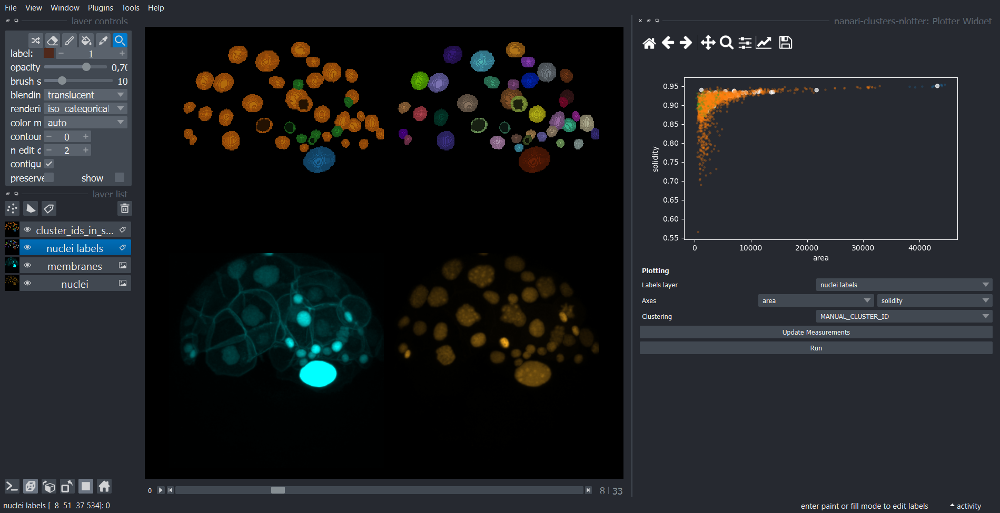

In [31]:
nbscreenshot(viewer)

If we plot the timelapse `frame` against the `intensity_mean`, we can see that the green and blue dots have higher `intensity_mean` than the orange ones:

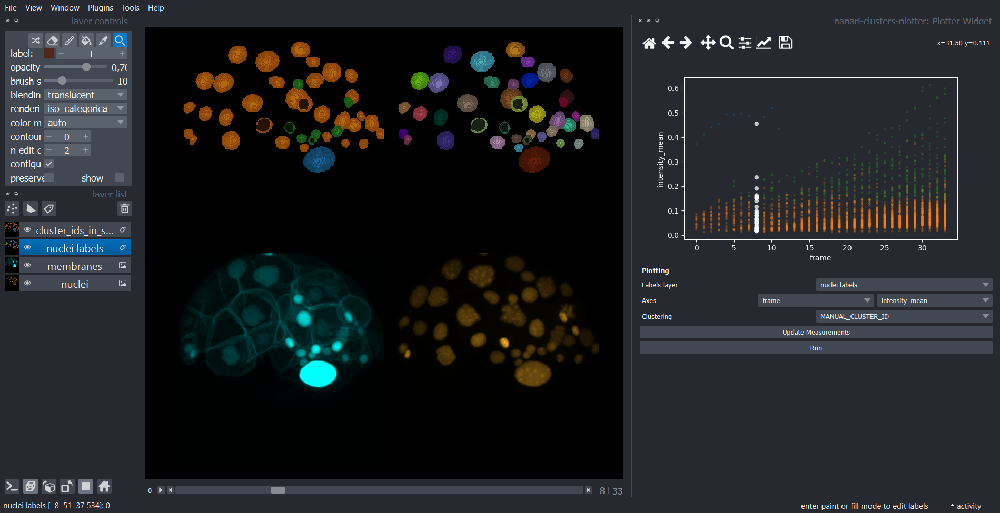

In [32]:
nbscreenshot(viewer)

If we plot `area` against `intensity_mean`, we can see that the green dots have a smaller `area`, but higher `intensity_mean`. Blue has both high `area` and `intensity_mean`:

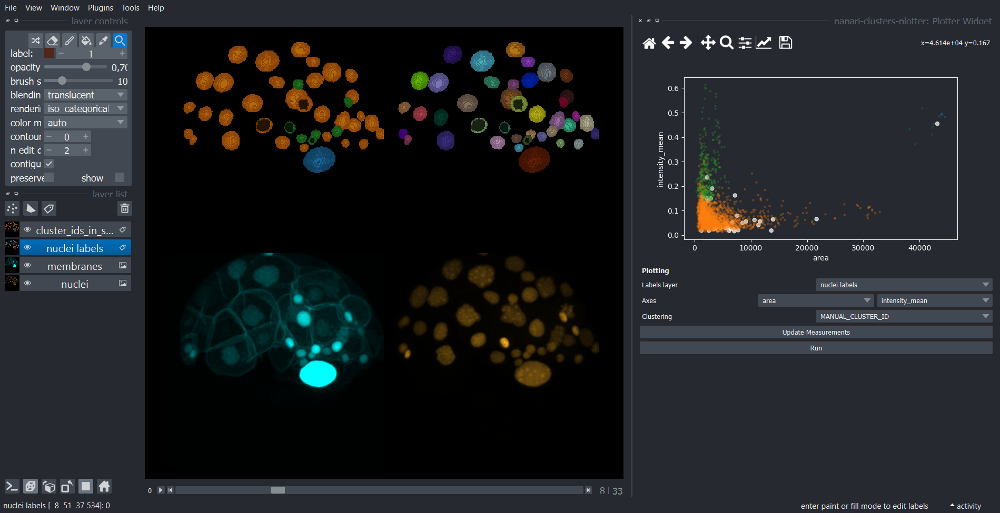

In [33]:
nbscreenshot(viewer)

We can see that our result is an interplay between shape- and intensity-based parameters. And we can explore that by switching between different spaces and visualizing them.

# Correlation matrix

We are now having a look on the correlation matrix to understand which parameter was influencing  the output of the UMAP.

Therefore we go to `Tools`--> `Measurements tables` --> `Feature correlation matrix (pamdas, APOC)`

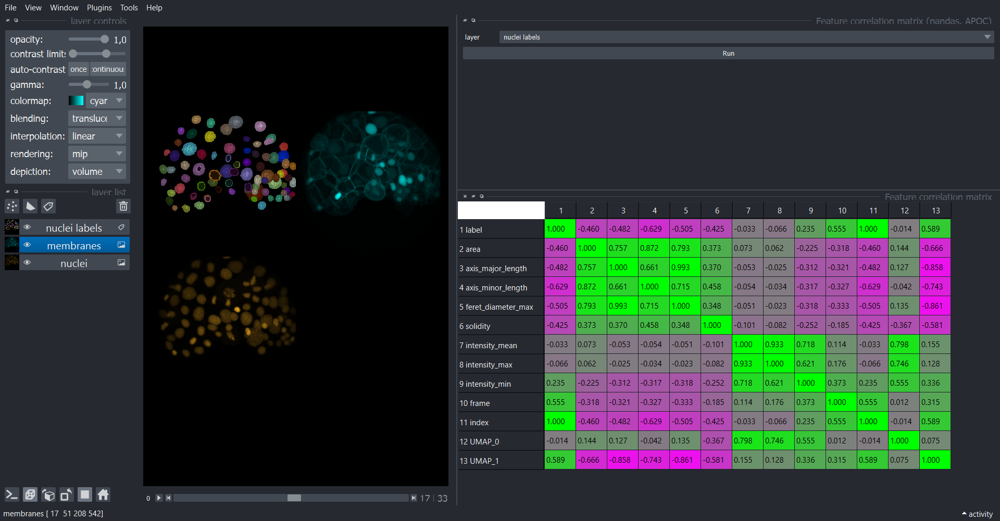

In [16]:
nbscreenshot(viewer)

In the correlation matrix we can see that there is a correlation between intensity_mean and UMAP_0.

# Other tried combinations

When we compute a UMAP out of all measurements, we are not able to separate the two groups:

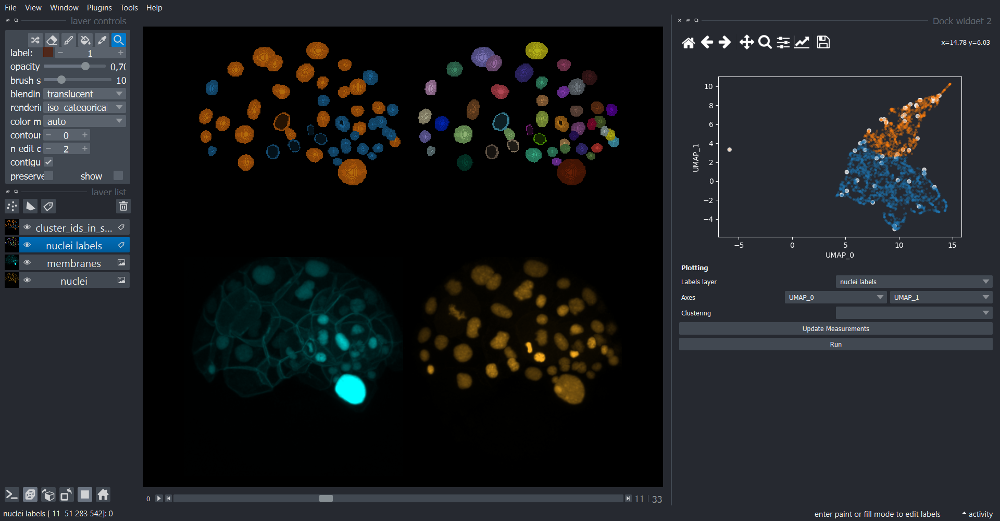

In [16]:
nbscreenshot(viewer)

Even if we select `all intensity measurements` it is not completely clear:

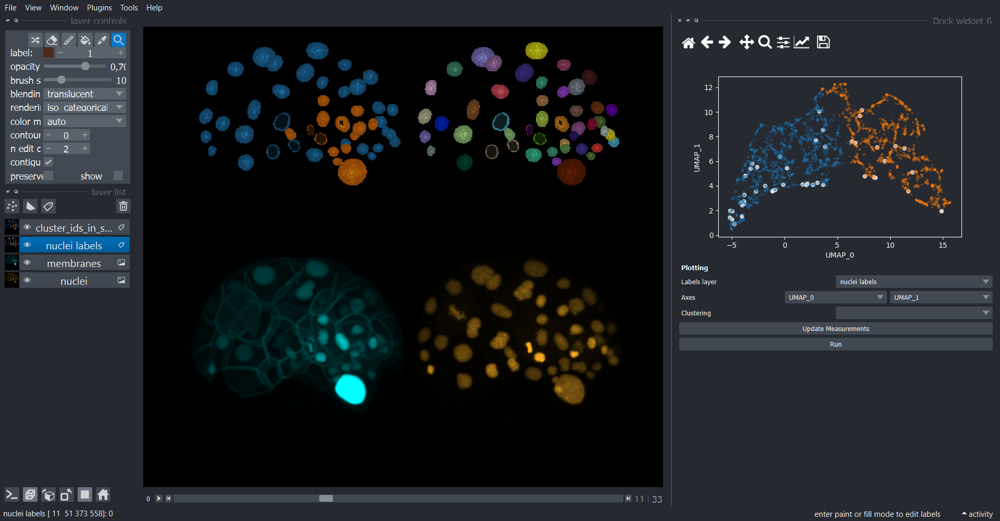

In [25]:
nbscreenshot(viewer)